# Explore shape distributions

This notebook plots shape metrics to understand the relationships.


_ANA: NOT SURE WHERE AND HOW TO USE THIS YET. I'D USE THE LAST ONE WITH THE SHAPES IN THE END WITH ARTIFACTS MARKED AT LEAST_

In [1]:
import os
import warnings

import geopandas
import dask_geopandas
import numpy
import pandas
import pooch
import pygeos
import osmnx as ox
import esda.shape as shape
import matplotlib.pyplot as plt
import matplotlib.cm as cm

from tqdm import tqdm
from shapely.affinity import translate

/Users/martin/mambaforge/envs/stable/lib/python3.10/site-packages/libpysal/examples/remotes.py:24: UserWarning: Remote data sets not available. Check connection.
  warnings.warn("Remote data sets not available. Check connection.")


In [2]:
import seaborn as sns
from palettable.cartocolors.qualitative import Bold_6


sns.set_theme(
    context="paper",
    style="ticks",
    rc={
        "patch.force_edgecolor": False,
        "axes.spines.top": False,
        "axes.spines.right": False,
        "axes.grid": True,
    },
    palette=Bold_6.hex_colors,
)


In [3]:
sample = geopandas.read_parquet("../data/sample.parquet")

In [4]:
all_poly = []
for i, row in sample.iterrows():
    fua = geopandas.read_parquet(f"../data/{int(row.eFUA_ID)}/polygons/")
    fua['continent'] = row.continent
    fua['country'] = row.Cntry_name
    fua['name'] = row.eFUA_name
    fua.crs = None
    all_poly.append(fua)
all_poly_data = pandas.concat(all_poly).reset_index(drop=True)

In [6]:
all_poly_data['area'] = all_poly_data.area

(-100.0, 20000.0)

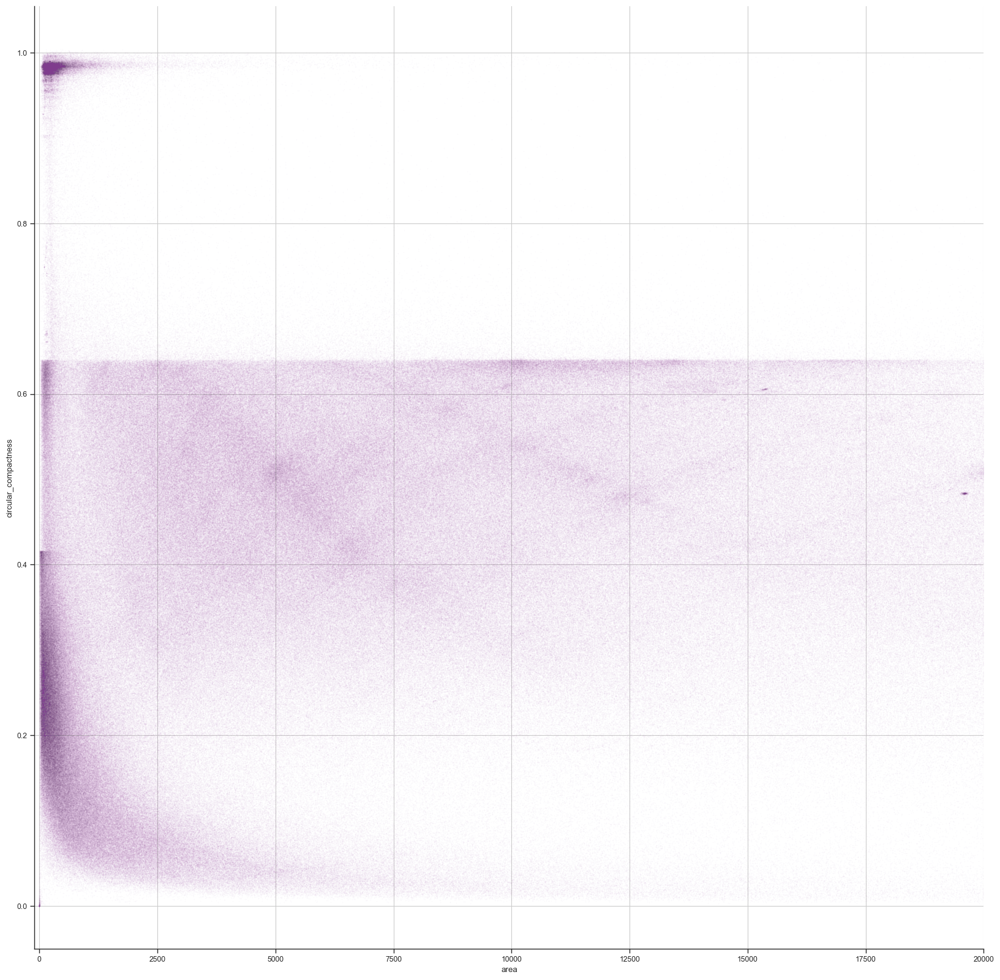

In [7]:
ax = all_poly_data.plot.scatter('area', 'circular_compactness', figsize=(20, 20), s=.0001)
ax.set_xlim(-100, 20000)
# ax.set_ylim(0, 2500)

(-100.0, 20000.0)

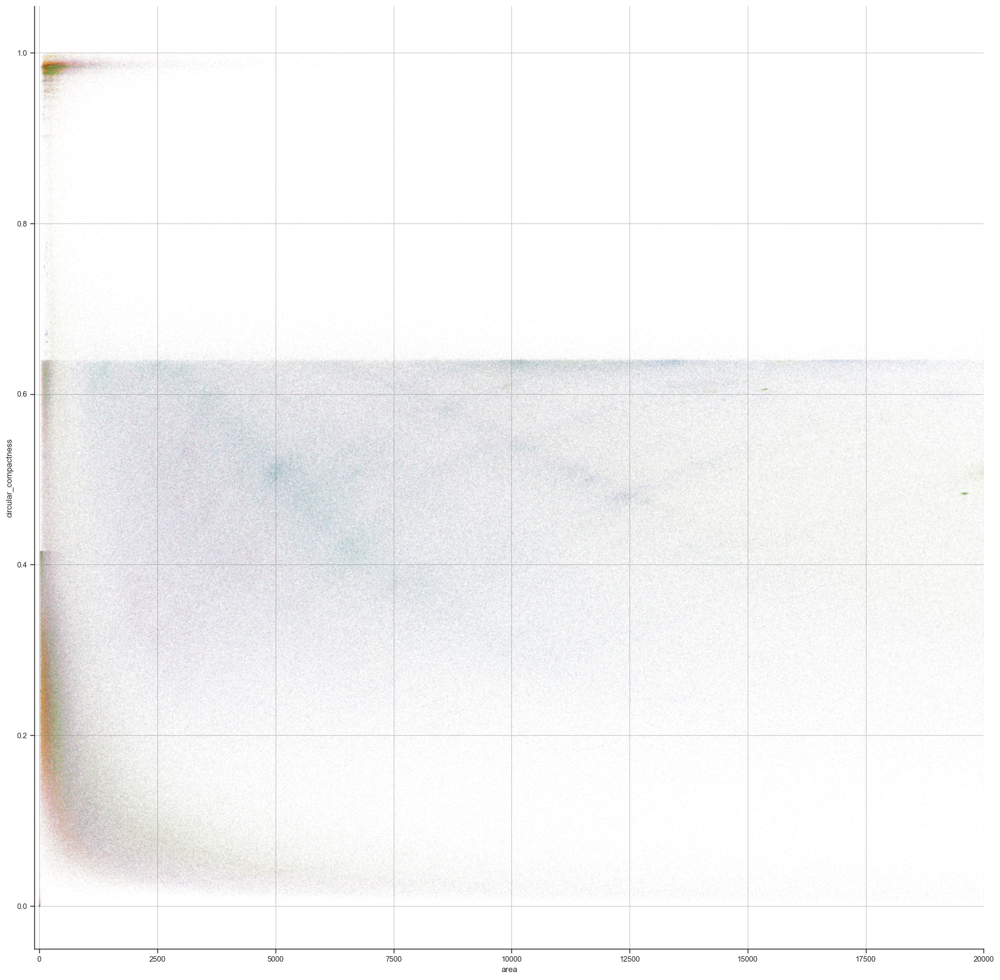

In [9]:
fig, ax = plt.subplots(figsize=(20, 20))
for i, c in enumerate(sample.continent.unique()):
    all_poly_data[all_poly_data.continent == c].plot.scatter('area', 'circular_compactness', s=.0001, color=Bold_6.hex_colors[i], ax=ax)
ax.set_xlim(-100, 20000)
# ax.set_ylim(0, 2500)

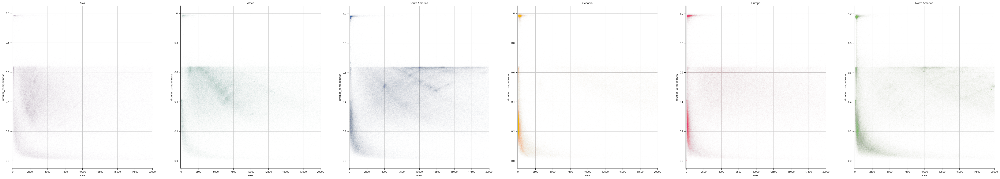

In [10]:
fig, ax = plt.subplots(1, 6, figsize=(60, 10))
for i, c in enumerate(sample.continent.unique()):
    all_poly_data[all_poly_data.continent == c].plot.scatter('area', 'circular_compactness', s=.00005, color=Bold_6.hex_colors[i], ax=ax[i])
    ax[i].set_xlim(-100, 20000)
    ax[i].set_title(c)
# ax.set_ylim(0, 2500)

In [11]:
small_set = all_poly_data.query('area < 20000').sample(10000, random_state=42)

In [12]:
centroid = small_set.centroid
small_set['x'] = centroid.x
small_set['y'] = centroid.y

In [14]:
translated = []
for i, row in small_set.iterrows():
    y = row.circular_compactness * 10000
    x = row.area / 2
    g = translate(row.geometry, xoff=-(row.x - x), yoff=-(row.y - y))
    
    translated.append(g)
small_set['translated'] = geopandas.GeoSeries(translated, index=small_set.index)

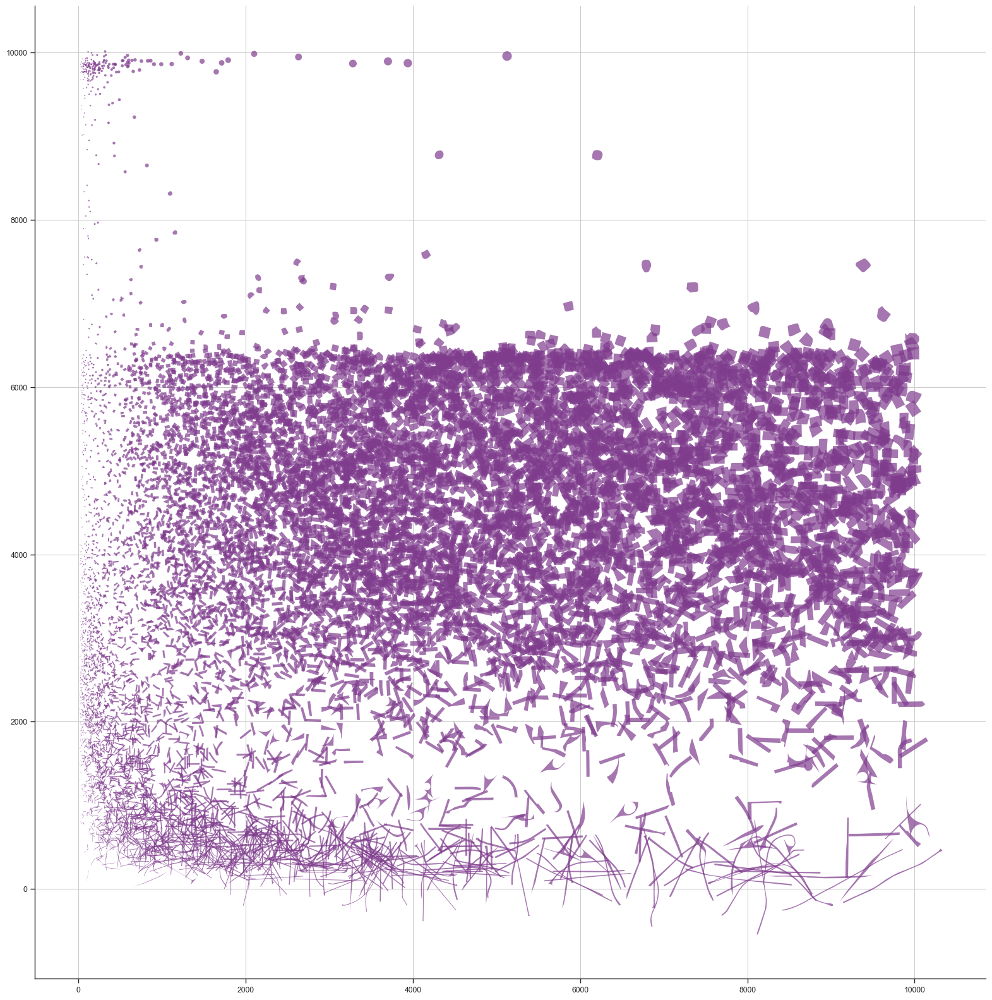

In [16]:
ax = small_set.set_geometry('translated').plot(aspect=1, figsize=(20, 20), alpha=.7)